In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

['dataset.csv']


Import the data and take a look at the first 5 lines.

In [2]:
# Print out a quick overview of the data
dataset=pd.read_csv("../input/dataset.csv")
dataset.head()

,URL,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CHARSET,SERVER,CONTENT_LENGTH,WHOIS_COUNTRY,WHOIS_STATEPRO,WHOIS_REGDATE,WHOIS_UPDATED_DATE,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS,DNS_QUERY_TIMES,Type
0,M0_109,16,7,iso-8859-1,nginx,263.0,None,None,10/10/2015 18:21,None,7,0,2,700,9,10,1153,832,9,2.0,1
1,B0_2314,16,6,UTF-8,Apache/2.4.10,15087.0,None,None,None,None,17,7,4,1230,17,19,1265,1230,17,0.0,0
2,B0_911,16,6,us-ascii,Microsoft-HTTPAPI/2.0,324.0,None,None,None,None,0,0,0,0,0,0,0,0,0,0.0,0
3,B0_113,17,6,ISO-8859-1,nginx,162.0,US,AK,7/10/1997 4:00,12/09/2013 0:45,31,22,3,3812,39,37,18784,4380,39,8.0,0
4,B0_403,17,6,UTF-8,None,124140.0,US,TX,12/05/1996 0:00,11/04/2017 0:00,57,2,5,4278,61,62,129889,4586,61,4.0,0


In [3]:
# Quick statistical summary of data
dataset.describe(include='all')

,URL,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CHARSET,SERVER,CONTENT_LENGTH,WHOIS_COUNTRY,WHOIS_STATEPRO,WHOIS_REGDATE,WHOIS_UPDATED_DATE,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS,DNS_QUERY_TIMES,Type
count,1781,1781.000000,1781.000000,1781,1780,969.000000,1781,1781,1781,1781,1781.000000,1781.000000,1781.000000,1.781000e+03,1781.000000,1781.000000,1.781000e+03,1.781000e+03,1781.000000,1780.000000,1781.000000
unique,1781,NaN,NaN,9,239,NaN,49,182,891,594,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,B0_860,NaN,NaN,UTF-8,Apache,NaN,US,CA,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,676,386,NaN,1103,372,127,139,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,56.961258,11.111735,NaN,NaN,11726.927761,NaN,NaN,NaN,NaN,16.261089,5.472768,3.060640,2.982339e+03,18.540146,18.746210,1.589255e+04,3.155599e+03,18.540146,2.263483,0.121280
std,NaN,27.555586,4.549896,NaN,NaN,36391.809051,NaN,NaN,NaN,NaN,40.500975,21.807327,3.386975,5.605057e+04,41.627173,46.397969,6.986193e+04,5.605378e+04,41.627173,2.930853,0.326544
min,NaN,16.000000,5.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
25%,NaN,39.000000,8.000000,NaN,NaN,324.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
50%,NaN,49.000000,10.000000,NaN,NaN,1853.000000,NaN,NaN,NaN,NaN,7.000000,0.000000,2.000000,6.720000e+02,8.000000,9.000000,5.790000e+02,7.350000e+02,8.000000,0.000000,0.000000
75%,NaN,68.000000,13.000000,NaN,NaN,11323.000000,NaN,NaN,NaN,NaN,22.000000,5.000000,5.000000,2.328000e+03,26.000000,25.000000,9.806000e+03,2.701000e+03,26.000000,4.000000,0.000000


From above, we see that URL is totally unique.  Also, per the glimpse at the first 5 lines above we can see it's some sort of identifier that seems to be some sort of mapping key that does not describe the URL at all.

In [4]:
# Drop the URL column since that is a unique column for training
dataset.drop('URL', axis=1, inplace=True)

Look at if there are any null values, this will be a problem with our model.

In [5]:
# Take a look at any null values to clean up data
# Likely need to do something with these empty datasets
print(dataset.isnull().sum())
dataset[pd.isnull(dataset).any(axis=1)]

URL_LENGTH                     0
NUMBER_SPECIAL_CHARACTERS      0
CHARSET                        0
SERVER                         1
CONTENT_LENGTH               812
WHOIS_COUNTRY                  0
WHOIS_STATEPRO                 0
WHOIS_REGDATE                  0
WHOIS_UPDATED_DATE             0
TCP_CONVERSATION_EXCHANGE      0
DIST_REMOTE_TCP_PORT           0
REMOTE_IPS                     0
APP_BYTES                      0
SOURCE_APP_PACKETS             0
REMOTE_APP_PACKETS             0
SOURCE_APP_BYTES               0
REMOTE_APP_BYTES               0
APP_PACKETS                    0
DNS_QUERY_TIMES                1
Type                           0
dtype: int64


,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CHARSET,SERVER,CONTENT_LENGTH,WHOIS_COUNTRY,WHOIS_STATEPRO,WHOIS_REGDATE,WHOIS_UPDATED_DATE,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS,DNS_QUERY_TIMES,Type
5,18,7,UTF-8,nginx,NaN,SC,Mahe,3/08/2016 14:30,3/10/2016 3:45,11,6,9,894,11,13,838,894,11,0.0,0
8,20,5,utf-8,nginx/1.10.1,NaN,None,None,8/11/2014 7:41,None,0,0,0,0,2,3,213,146,2,2.0,1
9,20,5,utf-8,nginx/1.10.1,NaN,None,None,8/11/2014 7:41,None,0,0,0,0,2,1,62,146,2,2.0,1
10,20,6,utf-8,Apache,NaN,US,Kansas,14/09/2007 0:00,9/09/2015 0:00,0,0,0,0,0,0,0,0,0,0.0,0
20,22,6,utf-8,openresty/1.11.2.1,NaN,US,CA,3/07/1999 0:00,7/08/2015 0:00,39,29,6,3833,43,42,22495,4125,43,4.0,0
24,22,6,UTF-8,nginx/1.12.0,NaN,US,FL,1/08/2002 0:00,22/03/2016 0:00,6,0,3,650,10,10,1417,950,10,4.0,0
26,22,6,ISO-8859-1,nginx/1.12.0,NaN,US,Texas,18/05/2005 19:41,19/05/2016 10:14,0,0,0,0,0,0,0,0,0,0.0,0
28,23,6,utf-8,Apache,NaN,US,FL,28/02/2008 10:58,14/02/2017 20:27,16,3,11,1696,18,20,13422,1844,18,2.0,0
34,23,7,UTF-8,nginx,NaN,None,None,None,None,24,5,8,1740,24,11,696,1740,24,0.0,0
35,23,6,None,None,NaN,US,TX,30/07/1996 0:00,4/07/2016 0:00,19,7,6,2404,23,20,6179,2684,23,4.0,0


We see that there are quite a bit where CONTENT_LENGTH is empty.  There's also one DNS_QUERY_TIMES that's empty and one SERVER that's empty.  We should interpolate the CONTENT_LENGTH since that is a large chunks of our data, but we could consider dropping the entry (or entries) that contain those two null.

In [6]:
# Interpolate our data to get rid of null values
dataset = dataset.interpolate()
print(dataset.isnull().sum())

URL_LENGTH                   0
NUMBER_SPECIAL_CHARACTERS    0
CHARSET                      0
SERVER                       1
CONTENT_LENGTH               0
WHOIS_COUNTRY                0
WHOIS_STATEPRO               0
WHOIS_REGDATE                0
WHOIS_UPDATED_DATE           0
TCP_CONVERSATION_EXCHANGE    0
DIST_REMOTE_TCP_PORT         0
REMOTE_IPS                   0
APP_BYTES                    0
SOURCE_APP_PACKETS           0
REMOTE_APP_PACKETS           0
SOURCE_APP_BYTES             0
REMOTE_APP_BYTES             0
APP_PACKETS                  0
DNS_QUERY_TIMES              0
Type                         0
dtype: int64


In [7]:
# For some reason there's still a isnull in the SERVER column
dataset['SERVER'].fillna('RARE_VALUE', inplace=True)

In [8]:
dataset.describe(include='all')

,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CHARSET,SERVER,CONTENT_LENGTH,WHOIS_COUNTRY,WHOIS_STATEPRO,WHOIS_REGDATE,WHOIS_UPDATED_DATE,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS,DNS_QUERY_TIMES,Type
count,1781.000000,1781.000000,1781,1781,1781.000000,1781,1781,1781,1781,1781.000000,1781.000000,1781.000000,1.781000e+03,1781.000000,1781.000000,1.781000e+03,1.781000e+03,1781.000000,1781.000000,1781.000000
unique,NaN,NaN,9,240,NaN,49,182,891,594,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,UTF-8,Apache,NaN,US,CA,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,676,386,NaN,1103,372,127,139,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,56.961258,11.111735,NaN,NaN,13497.243964,NaN,NaN,NaN,NaN,16.261089,5.472768,3.060640,2.982339e+03,18.540146,18.746210,1.589255e+04,3.155599e+03,18.540146,2.263335,0.121280
std,27.555586,4.549896,NaN,NaN,38415.552697,NaN,NaN,NaN,NaN,40.500975,21.807327,3.386975,5.605057e+04,41.627173,46.397969,6.986193e+04,5.605378e+04,41.627173,2.930036,0.326544
min,16.000000,5.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
25%,39.000000,8.000000,NaN,NaN,603.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
50%,49.000000,10.000000,NaN,NaN,4714.750000,NaN,NaN,NaN,NaN,7.000000,0.000000,2.000000,6.720000e+02,8.000000,9.000000,5.790000e+02,7.350000e+02,8.000000,0.000000,0.000000
75%,68.000000,13.000000,NaN,NaN,12578.500000,NaN,NaN,NaN,NaN,22.000000,5.000000,5.000000,2.328000e+03,26.000000,25.000000,9.806000e+03,2.701000e+03,26.000000,4.000000,0.000000


Convert columns into "dummy columns" so that our categorical data becomes discrete for model creation.

In [9]:
# Convert categorical columns to numbered categorical columns
dataset_with_dummies = pd.get_dummies(dataset,prefix_sep='--')
print(dataset_with_dummies.head())

   URL_LENGTH            ...             WHOIS_UPDATED_DATE--None
0          16            ...                                    1
1          16            ...                                    1
2          16            ...                                    1
3          17            ...                                    0
4          17            ...                                    0

[5 rows x 1979 columns]


Our classification is based on the "Type" column, so separate that out into two different dataframes.

In [10]:
# Separate predictors and response
X = dataset_with_dummies.drop('Type',axis=1) #Predictors
y = dataset_with_dummies['Type']

X.head()

,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CONTENT_LENGTH,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS,DNS_QUERY_TIMES,CHARSET--ISO-8859,CHARSET--ISO-8859-1,CHARSET--None,CHARSET--UTF-8,CHARSET--iso-8859-1,CHARSET--us-ascii,CHARSET--utf-8,CHARSET--windows-1251,CHARSET--windows-1252,SERVER--.V01 Apache,SERVER--294,SERVER--ATS,SERVER--ATS/5.3.0,SERVER--Aeria Games & Entertainment,SERVER--AkamaiGHost,SERVER--AmazonS3,SERVER--Apache,SERVER--Apache-Coyote/1.1,SERVER--Apache/1.3.27 (Unix) (Red-Hat/Linux) mod_perl/1.26 PHP/4.3.3 FrontPage/5.0.2 mod_ssl/2.8.12 OpenSSL/0.9.6b,SERVER--Apache/1.3.27 (Unix) PHP/4.4.1,SERVER--Apache/1.3.31 (Unix) PHP/4.3.9 mod_perl/1.29 rus/PL30.20,SERVER--Apache/1.3.33 (Unix) mod_ssl/2.8.24 OpenSSL/0.9.7e-p1 PHP/4.4.8,SERVER--Apache/1.3.34 (Unix) PHP/4.4.4,SERVER--Apache/1.3.37 (Unix) mod_perl/1.29 mod_ssl/2.8.28 OpenSSL/0.9.7e-p1,SERVER--Apache/1.3.39 (Unix) PHP/5.2.5 mod_auth_passthrough/1.8 mod_bwlimited/1.4 mod_log_bytes/1.2 mod_gzip/1.3.26.1a FrontPage/5.0.2.2635 DAV/1.0.3 mod_ssl/2.8.30 OpenSSL/0.9.7a,SERVER--Apache/1.3.42 Ben-SSL/1.60 (Unix) mod_gzip/1.3.26.1a mod_fastcgi/2.4.6 mod_throttle/3.1.2 Chili!Soft-ASP/3.6.2 FrontPage/5.0.2.2635 mod_perl/1.31 PHP/4.4.9,SERVER--Apache/2,...,WHOIS_UPDATED_DATE--7/12/2016 0:00,WHOIS_UPDATED_DATE--8/01/2016 0:00,WHOIS_UPDATED_DATE--8/01/2017 0:00,WHOIS_UPDATED_DATE--8/02/2017 0:00,WHOIS_UPDATED_DATE--8/03/2017 0:00,WHOIS_UPDATED_DATE--8/04/2017 0:00,WHOIS_UPDATED_DATE--8/04/2017 1:39,WHOIS_UPDATED_DATE--8/06/2015 0:00,WHOIS_UPDATED_DATE--8/08/2015 0:00,WHOIS_UPDATED_DATE--8/08/2016 0:00,WHOIS_UPDATED_DATE--8/09/2016 0:00,WHOIS_UPDATED_DATE--8/10/2014 0:00,WHOIS_UPDATED_DATE--8/11/2014 0:00,WHOIS_UPDATED_DATE--8/11/2016 0:00,WHOIS_UPDATED_DATE--8/12/2014 0:00,WHOIS_UPDATED_DATE--8/12/2015 0:00,WHOIS_UPDATED_DATE--8/12/2016 0:00,WHOIS_UPDATED_DATE--8/12/2016 14:01,WHOIS_UPDATED_DATE--9/01/2017 10:11,WHOIS_UPDATED_DATE--9/01/2017 16:53,WHOIS_UPDATED_DATE--9/02/2017 0:00,WHOIS_UPDATED_DATE--9/03/2015 0:00,WHOIS_UPDATED_DATE--9/03/2017 0:00,WHOIS_UPDATED_DATE--9/04/2014 0:00,WHOIS_UPDATED_DATE--9/04/2017 0:00,WHOIS_UPDATED_DATE--9/05/2016 0:00,WHOIS_UPDATED_DATE--9/06/2016 0:00,WHOIS_UPDATED_DATE--9/07/2016 0:00,WHOIS_UPDATED_DATE--9/08/2016 0:00,WHOIS_UPDATED_DATE--9/09/2013 0:00,WHOIS_UPDATED_DATE--9/09/2015 0:00,WHOIS_UPDATED_DATE--9/09/2015 20:47,WHOIS_UPDATED_DATE--9/09/2016 0:00,WHOIS_UPDATED_DATE--9/10/2015 0:00,WHOIS_UPDATED_DATE--9/11/2015 0:00,WHOIS_UPDATED_DATE--9/11/2016 0:00,WHOIS_UPDATED_DATE--9/12/2015 0:00,WHOIS_UPDATED_DATE--9/12/2015 14:43,WHOIS_UPDATED_DATE--9/12/2016 0:00,WHOIS_UPDATED_DATE--None
0,16,7,263.0,7,0,2,700,9,10,1153,832,9,2.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,16,6,15087.0,17,7,4,1230,17,19,1265,1230,17,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,16,6,324.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,17,6,162.0,31,22,3,3812,39,37,18784,4380,39,8.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,17,6,124140.0,57,2,5,4278,61,62,129889,4586,61,4.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Separate out our training and test data.  Our split will be a 70/30 split, and the random_state just ensures that someone else can recreate our test/training split and recreate our results.

In [11]:
# Get a training and test dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
# Train a Random Forest Regressor
from sklearn.ensemble import RandomForestClassifier

# n_estimators is the number of random forests to use
# n_jobs says to use all processors available
rf = RandomForestClassifier(n_estimators=100, n_jobs=-1, max_depth=30, criterion = 'entropy')
rf.fit(X_train, y_train)

print('Training Accuracy Score: {}'.format(rf.score(X_train, y_train)))

Training Accuracy Score: 1.0


In [13]:
y_pred = rf.predict(X_test)

In [14]:
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

# Visualize our results
def print_score(classifier,X_train,y_train,X_test,y_test,train=True):
    if train == True:
        print("Training results:\n")
        print('Accuracy Score: {0:.4f}\n'.format(accuracy_score(y_train,classifier.predict(X_train))))
        print('Classification Report:\n{}\n'.format(classification_report(y_train,classifier.predict(X_train))))
        print('Confusion Matrix:\n{}\n'.format(confusion_matrix(y_train,classifier.predict(X_train))))
        res = cross_val_score(classifier, X_train, y_train, cv=10, n_jobs=-1, scoring='accuracy')
        print('Average Accuracy:\t{0:.4f}\n'.format(res.mean()))
        print('Standard Deviation:\t{0:.4f}'.format(res.std()))
    elif train == False:
        print("Test results:\n")
        print('Accuracy Score: {0:.4f}\n'.format(accuracy_score(y_test,classifier.predict(X_test))))
        print('Classification Report:\n{}\n'.format(classification_report(y_test,classifier.predict(X_test))))
        print('Confusion Matrix:\n{}\n'.format(confusion_matrix(y_test,classifier.predict(X_test))))

print_score(rf,X_train,y_train,X_test,y_test,train=False)

Test results:

Accuracy Score: 0.9524

Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       306
           1       1.00      0.67      0.80        51

   micro avg       0.95      0.95      0.95       357
   macro avg       0.97      0.83      0.89       357
weighted avg       0.95      0.95      0.95       357


Confusion Matrix:
[[306   0]
 [ 17  34]]



To get a glimpse of what one of our Random Forest Decision Tree Classifiers look like, we'll print one out.

In [15]:
from sklearn.tree import export_graphviz

def create_graph(forest, feature_names):
    estimator = forest.estimators_[5]

    export_graphviz(estimator, out_file='tree.dot',
                    feature_names = feature_names,
                    class_names = ['benign', 'malicious'],
                    rounded = True, proportion = False, precision = 2, filled = True)

    # Convert to png using system command (requires Graphviz)
    from subprocess import call
    call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=200'])
    
graph = create_graph(rf, list(X))
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')


In [16]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn import metrics
from sklearn.metrics import matthews_corrcoef
import math
from statistics import mean

In [17]:
def sensit(cm):
    ans = cm[0,0]/(cm[0,0]+cm[1,0])
    return ans

def prec(cm):
    ans = cm[0,0]/(cm[0,0]+cm[0,1])
    return ans

In [18]:
cm = confusion_matrix(y_test, y_pred)

acc = cross_val_score(rf, X_test, y_test, scoring="accuracy")
sensitivity = sensit(cm)
rec = cross_val_score(rf, X_test, y_test, scoring="recall")
bcr = math.sqrt(sensitivity*mean(rec))
p = prec(cm)
f1 = cross_val_score(rf, X_test, y_test, scoring="f1")
mcc = matthews_corrcoef(y_test, y_pred)

/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


In [19]:
print(cm)

[[306   0]
 [ 17  34]]


In [20]:
print(acc,sensitivity,rec,bcr,p,f1,mcc)

[0.93277311 0.94957983 0.92436975] 0.9473684210526315 [0.52941176 0.70588235 0.47058824] 0.7339616409612132 1.0 [0.69230769 0.78571429 0.64      ] 0.7947194142390263


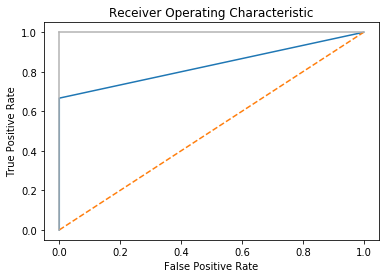

In [21]:
import matplotlib.pyplot as plt

false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_pred)
auc = metrics.auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [22]:
# View our feature importances
feature_importance_zip = zip(list(X), rf.feature_importances_)

# Sort the feature_importance_zip
sorted_importance = sorted(feature_importance_zip, key=lambda x: x[1], reverse=True)

for feature in sorted_importance[:15]:
    print(feature)

('SOURCE_APP_BYTES', 0.05478171850671914)
('REMOTE_APP_PACKETS', 0.04986052318235513)
('DIST_REMOTE_TCP_PORT', 0.04606477660246806)
('URL_LENGTH', 0.036954256258618055)
('WHOIS_UPDATED_DATE--2/09/2016 0:00', 0.03539684958971648)
('NUMBER_SPECIAL_CHARACTERS', 0.03537685148670786)
('WHOIS_REGDATE--17/09/2008 0:00', 0.03291696051052163)
('SOURCE_APP_PACKETS', 0.03210858598916979)
('REMOTE_IPS', 0.03035603857945675)
('APP_BYTES', 0.03027751826524361)
('REMOTE_APP_BYTES', 0.02950110262528259)
('CONTENT_LENGTH', 0.028904367897364454)
('WHOIS_STATEPRO--Barcelona', 0.02776383054412638)
('APP_PACKETS', 0.026293098793614033)
('WHOIS_COUNTRY--ES', 0.026039402689486714)


In [23]:
# Look at our feature importances without the dummy variables
original_feature_dict = {}
for feature, importance in zip(list(X), rf.feature_importances_):
    # Check for our dummy variable delimeter --
    if '--' in feature:
        original_feature_name = feature.split('--')[0]
    else:
        original_feature_name = feature
        
    # Add to our original_feature_dict, incrememnt if it's already there
    if original_feature_name in original_feature_dict:
        original_feature_dict[original_feature_name] += importance
    else:
        original_feature_dict[original_feature_name] = importance
      
# Sort the original_feature_dict
sorted_importance = sorted(original_feature_dict.items(), key=lambda x: x[1], reverse=True)

for feature, importance in sorted_importance:
    print(feature, importance)
    

WHOIS_REGDATE 0.13580856582066608
WHOIS_UPDATED_DATE 0.13166083537444012
WHOIS_STATEPRO 0.09082345728478208
SERVER 0.08640732587190494
WHOIS_COUNTRY 0.07948531273358317
SOURCE_APP_BYTES 0.05478171850671914
REMOTE_APP_PACKETS 0.04986052318235513
DIST_REMOTE_TCP_PORT 0.04606477660246806
URL_LENGTH 0.036954256258618055
NUMBER_SPECIAL_CHARACTERS 0.03537685148670786
CHARSET 0.03396080304443447
SOURCE_APP_PACKETS 0.03210858598916979
REMOTE_IPS 0.03035603857945675
APP_BYTES 0.03027751826524361
REMOTE_APP_BYTES 0.02950110262528259
CONTENT_LENGTH 0.028904367897364454
APP_PACKETS 0.026293098793614033
DNS_QUERY_TIMES 0.020878001221463806
TCP_CONVERSATION_EXCHANGE 0.020496860461725906


**Perform some data preprocessing and see how we can improve our dataset.**

First, there's a lot of SERVER types.  To reduce our dimesionality, we'll make that assumption that having a rare server type is more interesting then the specific server type for a decision tree classification.  It's possible we could extract interesting features of a server type (such as old versions, the "base" type such as nginx, the specific version type, etc.) which would be an interesting way to extend the research.

In [24]:
# Copy over our data so we don't overwrite the original results if we want
#    to tweak above
dataset_preprocessed = dataset

# Converting server types with only 1 unique count to a RARE_VALUE for classification
test = dataset_preprocessed ['SERVER'].value_counts()
col = 'SERVER'
dataset_preprocessed.loc[dataset_preprocessed[col].value_counts()[dataset_preprocessed[col]].values < 2, col] = "RARE_VALUE"

In [25]:
# Function to extract the registration year
def extract_reg_year(x):
    # If no year was reported, leave it as None
    if str(x) == 'None':
        return(x)
    
    # Try different parses for different date formats
    parse_error = False
    try:
        date = x.split(' ')[0]
        year = date.split('/')[2]
    except:
        parse_error = True
    
    # One more date format to try if there's a parse error
    if parse_error:
        try:
            date = x.split('T')[0]
            year = date.split('-')[0]
            parse_error = False
        except:
            parse_error = True
            raise ValueError('Error parsing {}'.format(x))

    return(year)

dataset_preprocessed['WHOIS_REGDATE'] = dataset_preprocessed['WHOIS_REGDATE'].apply(extract_reg_year)
dataset_preprocessed['WHOIS_UPDATED_DATE'] = dataset_preprocessed['WHOIS_UPDATED_DATE'].apply(extract_reg_year)

In [26]:
# State without country doesn't make sense
dataset_preprocessed['WHOIS_STATEPRO'] = dataset_preprocessed[['WHOIS_COUNTRY','WHOIS_STATEPRO']].apply(lambda x : '{}-{}'.format(x[0],x[1]), axis=1)

In [27]:
dataset_preprocessed.describe(include='all')

,URL_LENGTH,NUMBER_SPECIAL_CHARACTERS,CHARSET,SERVER,CONTENT_LENGTH,WHOIS_COUNTRY,WHOIS_STATEPRO,WHOIS_REGDATE,WHOIS_UPDATED_DATE,TCP_CONVERSATION_EXCHANGE,DIST_REMOTE_TCP_PORT,REMOTE_IPS,APP_BYTES,SOURCE_APP_PACKETS,REMOTE_APP_PACKETS,SOURCE_APP_BYTES,REMOTE_APP_BYTES,APP_PACKETS,DNS_QUERY_TIMES,Type
count,1781.000000,1781.000000,1781,1781,1781.000000,1781,1781,1781,1781,1781.000000,1781.000000,1781.000000,1.781000e+03,1781.000000,1781.000000,1.781000e+03,1.781000e+03,1781.000000,1781.000000,1781.000000
unique,NaN,NaN,9,98,NaN,49,211,30,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,UTF-8,Apache,NaN,US,US-CA,2000,2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,676,386,NaN,1103,371,163,722,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,56.961258,11.111735,NaN,NaN,13497.243964,NaN,NaN,NaN,NaN,16.261089,5.472768,3.060640,2.982339e+03,18.540146,18.746210,1.589255e+04,3.155599e+03,18.540146,2.263335,0.121280
std,27.555586,4.549896,NaN,NaN,38415.552697,NaN,NaN,NaN,NaN,40.500975,21.807327,3.386975,5.605057e+04,41.627173,46.397969,6.986193e+04,5.605378e+04,41.627173,2.930036,0.326544
min,16.000000,5.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
25%,39.000000,8.000000,NaN,NaN,603.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
50%,49.000000,10.000000,NaN,NaN,4714.750000,NaN,NaN,NaN,NaN,7.000000,0.000000,2.000000,6.720000e+02,8.000000,9.000000,5.790000e+02,7.350000e+02,8.000000,0.000000,0.000000
75%,68.000000,13.000000,NaN,NaN,12578.500000,NaN,NaN,NaN,NaN,22.000000,5.000000,5.000000,2.328000e+03,26.000000,25.000000,9.806000e+03,2.701000e+03,26.000000,4.000000,0.000000


We've reduced our number of unique values in our column sets quite a bit.
* SERVER (web server types) are now 98 vs. the original 240
* WHOIS_REGDATE is now down to 30 vs. 891
* WHOIS_UPDATED_DATE is now down to 10 vs. 594

In [28]:
# As above, create our random forest classifier the same way

# Convert categorical columns to numbered categorical columns
dataset_pp_with_dummies = pd.get_dummies(dataset_preprocessed, prefix_sep='--')

# Separate predictors and response
X_pp = dataset_pp_with_dummies.drop('Type',axis=1) #Predictors
y_pp = dataset_pp_with_dummies['Type']

# Get a training and test dataset
from sklearn.model_selection import train_test_split
X_pp_train, X_pp_test, y_pp_train, y_pp_test = train_test_split(X_pp, y_pp, test_size=0.3, random_state=42)

# Train a Random Forest Regressor
from sklearn.ensemble import RandomForestClassifier

# n_estimators is the number of random forests to use
# n_jobs says to use all processors available
# Properties we can play with for the RandomForestClassifier function:
#    max_depth=int( default None, n_estimators=int(default 10), min_samples_split=int(default 2)
rf_pp = RandomForestClassifier(n_estimators=100, n_jobs=-1, max_depth=30, criterion = 'entropy')
rf_pp.fit(X_pp_train, y_pp_train)

print('Training Accuracy Score: {}'.format(rf_pp.score(X_pp_train, y_pp_train)))

Training Accuracy Score: 1.0


In [29]:
y_pp_pred = rf_pp.predict(X_pp_test)
print_score(rf_pp,X_pp_train,y_pp_train,X_pp_test,y_pp_test,train=False)

Test results:

Accuracy Score: 0.9551

Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       462
           1       0.98      0.68      0.81        73

   micro avg       0.96      0.96      0.96       535
   macro avg       0.97      0.84      0.89       535
weighted avg       0.96      0.96      0.95       535


Confusion Matrix:
[[461   1]
 [ 23  50]]



In [30]:
# View our feature importances
feature_importance_zip = zip(list(X_pp), rf_pp.feature_importances_)

# Sort the feature_importance_zip
sorted_importance = sorted(feature_importance_zip, key=lambda x: x[1], reverse=True)

for feature in sorted_importance[:15]:
    print(feature)

('REMOTE_APP_PACKETS', 0.0633785263754053)
('DIST_REMOTE_TCP_PORT', 0.056657266565703406)
('SOURCE_APP_BYTES', 0.05141048936461475)
('URL_LENGTH', 0.043407756773722606)
('REMOTE_IPS', 0.04291078861421286)
('WHOIS_STATEPRO--ES-Barcelona', 0.03901321374805984)
('CONTENT_LENGTH', 0.03898361605276516)
('WHOIS_COUNTRY--ES', 0.03896130062669276)
('NUMBER_SPECIAL_CHARACTERS', 0.0375757512750076)
('APP_BYTES', 0.0371512305435166)
('APP_PACKETS', 0.034476580364067436)
('REMOTE_APP_BYTES', 0.03272786910574265)
('TCP_CONVERSATION_EXCHANGE', 0.03244856659819811)
('SOURCE_APP_PACKETS', 0.02892026319196974)
('DNS_QUERY_TIMES', 0.02405498982311327)


In [31]:
# Look at our feature importances without the dummy variables
original_feature_dict = {}
for feature, importance in zip(list(X_pp), rf_pp.feature_importances_):
    # Check for our dummy variable delimeter --
    if '--' in feature:
        original_feature_name = feature.split('--')[0]
    else:
        original_feature_name = feature
        
    # Add to our original_feature_dict, incrememnt if it's already there
    if original_feature_name in original_feature_dict:
        original_feature_dict[original_feature_name] += importance
    else:
        original_feature_dict[original_feature_name] = importance
      
# Sort the original_feature_dict
sorted_importance = sorted(original_feature_dict.items(), key=lambda x: x[1], reverse=True)

for feature, importance in sorted_importance:
    print(feature, importance)

WHOIS_STATEPRO 0.12328018550209582
WHOIS_COUNTRY 0.0934542833321481
SERVER 0.09213984077351797
WHOIS_REGDATE 0.08266300017075726
REMOTE_APP_PACKETS 0.0633785263754053
DIST_REMOTE_TCP_PORT 0.056657266565703406
SOURCE_APP_BYTES 0.05141048936461475
WHOIS_UPDATED_DATE 0.04644940808947932
URL_LENGTH 0.043407756773722606
REMOTE_IPS 0.04291078861421286
CONTENT_LENGTH 0.03898361605276516
CHARSET 0.037909587483962
NUMBER_SPECIAL_CHARACTERS 0.0375757512750076
APP_BYTES 0.0371512305435166
APP_PACKETS 0.034476580364067436
REMOTE_APP_BYTES 0.03272786910574265
TCP_CONVERSATION_EXCHANGE 0.03244856659819811
SOURCE_APP_PACKETS 0.02892026319196974
DNS_QUERY_TIMES 0.02405498982311327


In [32]:
create_graph(rf_pp, list(X_pp))
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

Tweaking parameters of the random forest classifier

In [33]:
cm = confusion_matrix(y_pp_test, y_pp_pred)

acc = cross_val_score(rf_pp, X_pp_test, y_pp_test, scoring="accuracy")
sensitivity = sensit(cm)
rec = cross_val_score(rf_pp, X_pp_test, y_pp_test, scoring="recall")
bcr = math.sqrt(sensitivity*mean(rec))
p = prec(cm)
f1 = cross_val_score(rf_pp, X_pp_test, y_pp_test, scoring="f1")
mcc = matthews_corrcoef(y_pp_test, y_pp_pred)

/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


In [34]:
print(acc,sensitivity,rec,bcr,p,f1,mcc)

[0.92178771 0.94382022 0.94382022] 0.9524793388429752 [0.4        0.58333333 0.70833333] 0.7328659605069598 0.9978354978354979 [0.57142857 0.73684211 0.79069767] 0.7980813723417156


In [35]:
print(cm)

[[461   1]
 [ 23  50]]


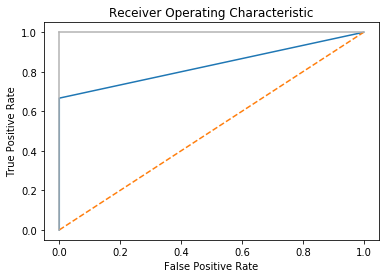

In [36]:
import matplotlib.pyplot as plt

false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_pred)
auc = metrics.auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()